### Data Exploration

In [1]:
# import required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore') # remove warnings output

# read train data as df
df = pd.read_csv('housing_train.csv')

## Initial Exploration

In [2]:
df.head()
df.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', 'X1stFlrSF', 'X2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDri

In [3]:
df.describe()   
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1200 entries, 0 to 1199
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1200 non-null   int64  
 1   MSSubClass     1200 non-null   int64  
 2   MSZoning       1200 non-null   object 
 3   LotFrontage    989 non-null    float64
 4   LotArea        1200 non-null   int64  
 5   Street         1200 non-null   object 
 6   Alley          71 non-null     object 
 7   LotShape       1200 non-null   object 
 8   LandContour    1200 non-null   object 
 9   Utilities      1200 non-null   object 
 10  LotConfig      1200 non-null   object 
 11  LandSlope      1200 non-null   object 
 12  Neighborhood   1200 non-null   object 
 13  Condition1     1200 non-null   object 
 14  Condition2     1200 non-null   object 
 15  BldgType       1200 non-null   object 
 16  HouseStyle     1200 non-null   object 
 17  OverallQual    1200 non-null   int64  
 18  OverallC

In [4]:
df.shape

(1200, 81)

We can drop the 'Id' column since we do not need it in the training dataset

In [5]:
df.drop('Id', axis=1, inplace=True)

Now, we can convert some of the variables to string type, because it is actually a categorical variables which is provided as int type. We want to make sure that the numerical and categorical variables are distinguished correctly.

In [6]:
df['MSSubClass'] = df['MSSubClass'].apply(str)
df['YrSold'] = df['YrSold'].astype(str)
df['MoSold'] = df['MoSold'].astype(str)

### Numerical and Categorical Variables

We first detect numerical variables and categorical variables and assign it into lists.

In [7]:
num_var = df.dtypes[df.dtypes != "object"].index
print(f"Total Numerical Variables: {len(num_var)}\n{list(df[num_var].columns)}\n")

cat_var = df.dtypes[df.dtypes == "object"].index
print(f"Total Categorical Variables: {len(cat_var)}\n{list(df[cat_var].columns)}")

Total Numerical Variables: 34
['LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'X1stFlrSF', 'X2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', 'X3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'SalePrice']

Total Categorical Variables: 46
['MSSubClass', 'MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'Fireplace

## Missing Values

For the missing values, we first find some of the features with NA values and compute the percentage of missing values for each features. Then, we proceed to check each features and find suitable methods to fill in the data or if the feature is not important, we can drop it.

In [8]:
count_null = df.isnull().sum().sort_values(ascending=False)
percent_null = (df.isnull().sum() / len(df)) * 100
percent_null = percent_null[percent_null != 0].sort_values(ascending = False)
missing_data = pd.concat([count_null, percent_null], axis=1, keys=['Total', 'Percent'])

print(f'Total Missing Values: {count_null.sum()}')
missing_data.head(20)

Total Missing Values: 5750


,Total,Percent
PoolQC,1194,99.500000
MiscFeature,1158,96.500000
Alley,1129,94.083333
Fence,974,81.166667
FireplaceQu,575,47.916667
LotFrontage,211,17.583333
GarageCond,69,5.750000
GarageQual,69,5.750000
GarageType,69,5.750000
GarageFinish,69,5.750000


Currently, there are 5750 Missing Values from all of the variables. Then, we can fill the NA Values starting from feature that have the highest percentage of NA values, PoolQC (Pool Quality). For this variable, we can fill the NA values with 'None' since NA means there is no pool, knowing that almost all the houses do not have pool.

In [9]:
df['PoolQC'].fillna('None', inplace=True)
df[['PoolQC']]

,PoolQC
0,None
1,None
2,None
3,None
4,None
...,...
1195,None
1196,None
1197,None
1198,None


Since the features with high percentage of NA values have the same case with PoolQC, such as MiscFeatures(other features), Alley(type of alley access), Fence(fence quality), FireplaceQu(fireplace quality), etc which has values None for NA, we can fill in the NA values with None.

In [10]:
fill_with_none_cols = ['MiscFeature', 'Alley', 'Fence', 'FireplaceQu',
                        'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond',
                        'BsmtExposure', 'BsmtFinType2', 'BsmtCond', 'BsmtFinType1', 'BsmtQual',
                        'MasVnrType']
                        
for feature_name in fill_with_none_cols:
    df[feature_name].fillna('None', inplace=True)

df[fill_with_none_cols]

,MiscFeature,Alley,Fence,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,BsmtExposure,BsmtFinType2,BsmtCond,BsmtFinType1,BsmtQual,MasVnrType
0,None,None,MnPrv,None,Detchd,Unf,TA,TA,No,Unf,TA,BLQ,TA,None
1,None,None,None,None,Attchd,Unf,TA,TA,No,Unf,TA,BLQ,Gd,None
2,Gar2,None,None,TA,BuiltIn,RFn,TA,TA,No,Rec,TA,GLQ,Gd,None
3,None,None,None,Gd,Attchd,RFn,TA,TA,Av,Unf,TA,Unf,Ex,Stone
4,None,None,None,None,Attchd,RFn,TA,TA,Av,Unf,TA,Unf,Gd,BrkFace
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1195,None,None,None,Gd,Attchd,RFn,TA,TA,Gd,Unf,TA,GLQ,Gd,Stone
1196,None,None,None,None,Attchd,RFn,TA,TA,No,Unf,TA,GLQ,Gd,BrkFace
1197,None,None,None,Gd,Detchd,Unf,TA,TA,No,Unf,TA,ALQ,Gd,BrkFace
1198,None,None,None,None,Attchd,Unf,TA,TA,Mn,Unf,TA,GLQ,Gd,BrkFace


In [11]:
garage_area = len(df[df['GarageArea'] == 0])
garage_yr_blt = len(df[df['GarageYrBlt'].isnull()])

print(f'Houses with Garage Area = 0 (No Garage) : {garage_area}, Houses with NA Values GarageYrBlt (Year Garage was built) : {garage_yr_blt}')

Houses with Garage Area = 0 (No Garage) : 69, Houses with NA Values GarageYrBlt (Year Garage was built) : 69


If the Garage Area is 0, the values of GarageYrBlt should also be 0 because the houses have no garage.

For MasVnrArea, we can assume that NA values means it has no MasVnr so MasVnrArea is 0.

In [12]:
fill_with_zero = ['GarageYrBlt', 'MasVnrArea']

for feature_name in fill_with_zero:
    df[feature_name].fillna(0, inplace=True)

df[fill_with_zero]

,GarageYrBlt,MasVnrArea
0,1979.0,0.0
1,1984.0,0.0
2,1977.0,1.0
3,2006.0,250.0
4,2004.0,106.0
...,...,...
1195,2008.0,338.0
1196,1998.0,116.0
1197,1957.0,180.0
1198,2004.0,266.0


For LotFrontage, we can assume that the street size connected to a house will be similar with other houses in the same neighborhood. So, we can fill in the NA values with the median LotFrontage value in the same Neighborhood to avoid inaccurate result due to outliers.

In [13]:
df['LotFrontage'] = df.groupby('Neighborhood')['LotFrontage'].transform(lambda x: x.fillna(x.median()))

Check if there is still NA values

In [14]:
percent_null = (df.isnull().sum() / len(df)) * 100
percent_null = percent_null[percent_null != 0].sort_values(ascending = False)
percent_null

Series([], dtype: float64)

So, we have filled in 5750 Missing Values in the train dataset, without dropping any of them.

## Outliers

First, let's check the current distribution of SalePrice by using Box Plot and directly remove the outliers by using the Inter Quartile Range method.

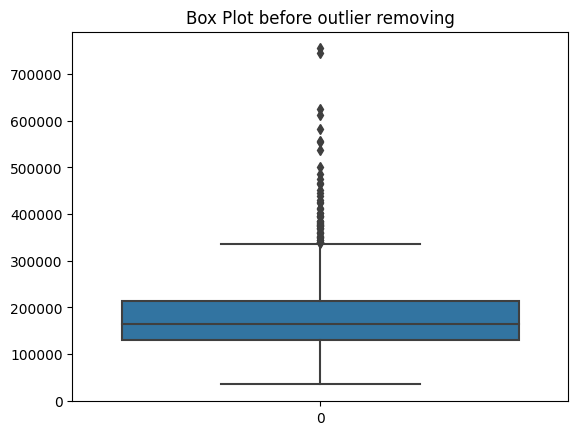

In [15]:
sns.boxplot(df['SalePrice'])
plt.title("Box Plot before outlier removing")
plt.show()

Lower Bound: -77662.5, Upper Bound: 420487.5
Before dropping outliers shape: (1200, 80)
After dropping outliers shape: (1181, 80)


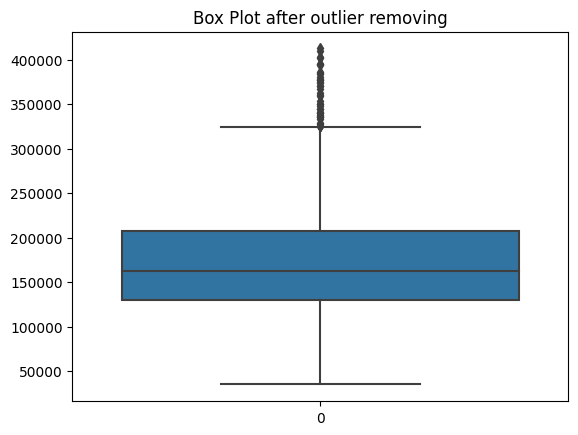

In [16]:
q1 = df['SalePrice'].quantile(0.25)
q3 = df['SalePrice'].quantile(0.75)
iqr = q3-q1
lower = q1 - 2.5 * iqr
upper = q3 + 2.5 * iqr

print(f'Lower Bound: {lower}, Upper Bound: {upper}')

print(f'Before dropping outliers shape: {df.shape}')

filtered_df = df[(df['SalePrice'] > lower) & (df['SalePrice'] < upper)]

print(f'After dropping outliers shape: {filtered_df.shape}')

sns.boxplot(filtered_df['SalePrice'])
plt.title("Box Plot after outlier removing")
plt.show()

We found that the lower bound for the sale price is negative, so no data were removed on the lower bound side. For the upper bound, we removed data with SalePrice higher or equal than 420487.5.

However, we can still see there are many data higher than the upper bound mark (Q3). Thus, we can choose 1 variable that will probably have a strong correlation to SalePrice which is GrLivArea (larger area indicate higher price).

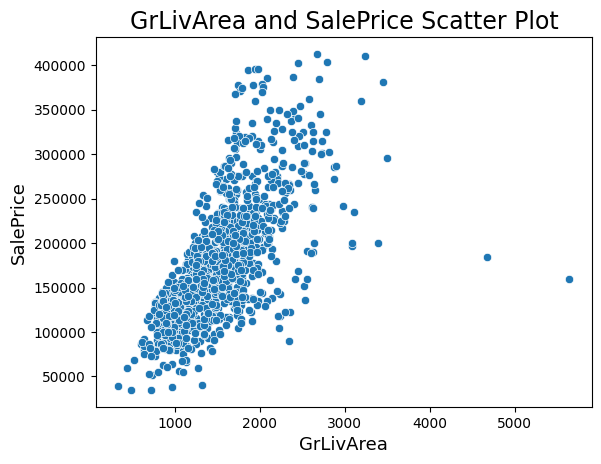

In [17]:
fig, ax = plt.subplots()

sns.scatterplot(x = filtered_df['GrLivArea'], y = filtered_df['SalePrice'])
plt.xlabel('GrLivArea', fontsize=13)
plt.ylabel('SalePrice', fontsize=13)
plt.title('GrLivArea and SalePrice Scatter Plot', fontsize=17)
plt.show()

There are still 2 houses on the bottom-right, which have the largest GrLivArea but have low SalePrice, so we can also remove this since it can be considered as outliers.

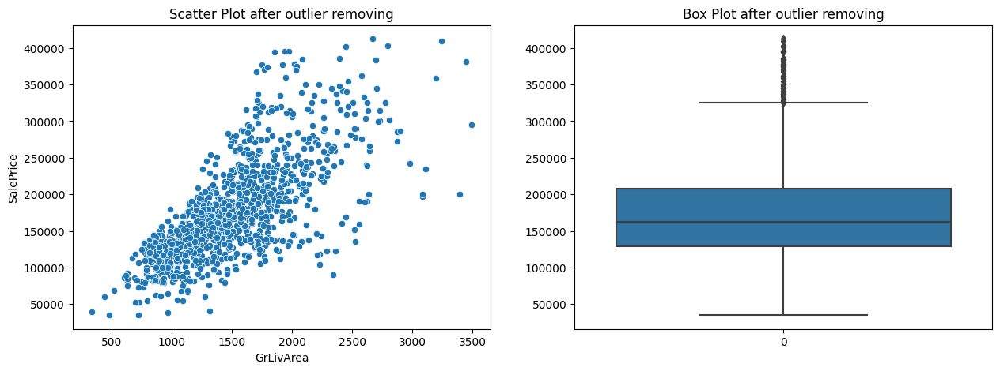

In [18]:
filtered_df = filtered_df[filtered_df['GrLivArea'] < 4000]

fig, ax = plt.subplots(1, 2, figsize=(15,5))
sns.scatterplot(x = filtered_df['GrLivArea'], y = filtered_df['SalePrice'], ax = ax[0])
sns.boxplot(filtered_df['SalePrice'], ax = ax[1])

# ax[0].xlabel('GrLivArea', fontsize=10)
# ax[0].ylabel('SalePrice', fontsize=10)

ax[0].set_title('Scatter Plot after outlier removing')
ax[1].set_title("Box Plot after outlier removing")
plt.show()

Now, we already remove the outliers and fill in missing values. So, next let's visualize the data.

### Data Visualization

In [19]:
filtered_df.shape

(1179, 80)

## Heat Map

From 34 numerical variables, we can find the variables that have high correlation to SalePrice by plotting a heat map.

We can select 23 numerical variables with the highest correlation.

22 Numerical Variables with highest correlation to SalePrice: 
['OverallQual' 'GrLivArea' 'GarageCars' 'GarageArea' 'TotalBsmtSF'
 'X1stFlrSF' 'FullBath' 'YearBuilt' 'YearRemodAdd' 'TotRmsAbvGrd'
 'Fireplaces' 'MasVnrArea' 'BsmtFinSF1' 'LotFrontage' 'OpenPorchSF'
 'WoodDeckSF' 'X2ndFlrSF' 'HalfBath' 'GarageYrBlt' 'LotArea'
 'BsmtFullBath' 'BsmtUnfSF']


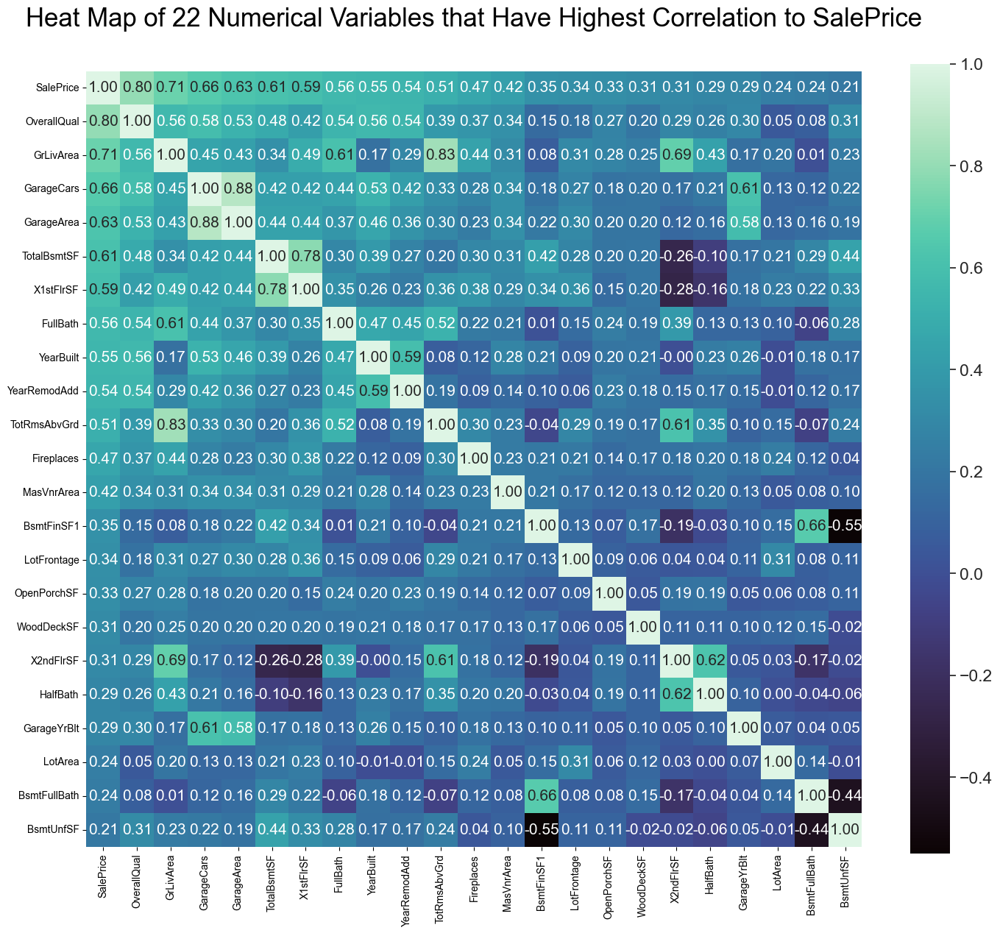

In [20]:
n_var = 23
matrix = filtered_df.corr()
cols = matrix.nlargest(n_var, 'SalePrice')['SalePrice'].index
corr_mat = np.corrcoef(filtered_df[cols].values.T)

print(f'22 Numerical Variables with highest correlation to SalePrice: \n{cols.values[1:]}')

fig, ax = plt.subplots(figsize=(17, 17))

sns.set(font_scale=1.5)
plt.title('Heat Map of 22 Numerical Variables that Have Highest Correlation to SalePrice', y = 1.05, fontsize = 25)

heat_map = sns.heatmap(corr_mat, cbar = True, cbar_kws={'shrink': .82}, cmap = 'mako',
                        annot = True, square = True, fmt = '.2f', annot_kws={'size' : 15}, 
                        yticklabels = cols.values, xticklabels = cols.values)

From the heatmap, we can see that OverallQual, GrLivArea, GarageCars, GarageArea, and TotalBsmtSF are the 6 variables that have > 0.60 pearson correlation to the target variable SalePrice.

Other findings:
- GrLivArea has high correlation to TotalRmsAbvGrd, FullBath, and HalfBath, it is understandable since larger rooms or toilets will result in larger area of the house.
- GarageCars is highly correlated to GarageArea, since larger area means it can have more cars capacity. GarageCars and GarageArea are also correlated to GarageYrBlt, which means newer Garage built have larger cars capacity.
- TotalBsmtSF and 1stFlrSF is correlated, meaning that houses which have larger Basement size tends to have larger 1st Floor size
- YearBuilt is slightly correlated to OverallQual, which mean newer houses built tends to have better overall quality.


Although, some of the numerical variables have small value of correlation to SalePrice, we can keep them and not dropping them since later we will use PCA to reduce the dimension of the dataset.

### Assign Price Group to each house according to the SalePrice

SalePrice <= 300000 : Below 300k

SalePrice > 300000 : Above 300k

In [21]:
conditions = [
    (filtered_df['SalePrice'] <= 300000),
    (filtered_df['SalePrice'] > 300000)
    ]

values = ['Below 300k', 'Above 300k']

filtered_df['SalePriceGroup'] = np.select(conditions, values)

filtered_df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,SalePriceGroup
0,20,RH,60.0,7800,Pave,None,Reg,Lvl,AllPub,Corner,...,None,MnPrv,None,0,7,2006,WD,Abnorml,119900,Below 300k
1,20,RL,59.0,11120,Pave,None,IR1,Lvl,AllPub,CulDSac,...,None,None,None,0,6,2008,WD,Normal,162500,Below 300k
2,90,RL,71.0,18890,Pave,None,IR1,Lvl,AllPub,Inside,...,None,None,Gar2,8300,8,2007,WD,Normal,190000,Below 300k
3,20,RL,87.0,11146,Pave,None,IR1,Lvl,AllPub,Inside,...,None,None,None,0,7,2009,WD,Normal,255500,Below 300k
4,20,RL,63.0,8500,Pave,None,Reg,Lvl,AllPub,FR2,...,None,None,None,0,11,2007,WD,Normal,179600,Below 300k


## Pairwise Plot

Then, we can take the 10 most correlated variables to SalePrice into a pairwise plot to find some insights between each of the variable and have a glance on the variable distribution.

We make the pairplot with regplot, that have the scatter points and the regression line when plotting the relationship between two different variables. In addition, we assign the hue to be the SalePriceGroup to see the difference of the distribution or house prices in different level of prices.

Text(0.5, 1.02, 'Pairwise Plot of 9 Most Correlated Numerical Variables to SalePrice')

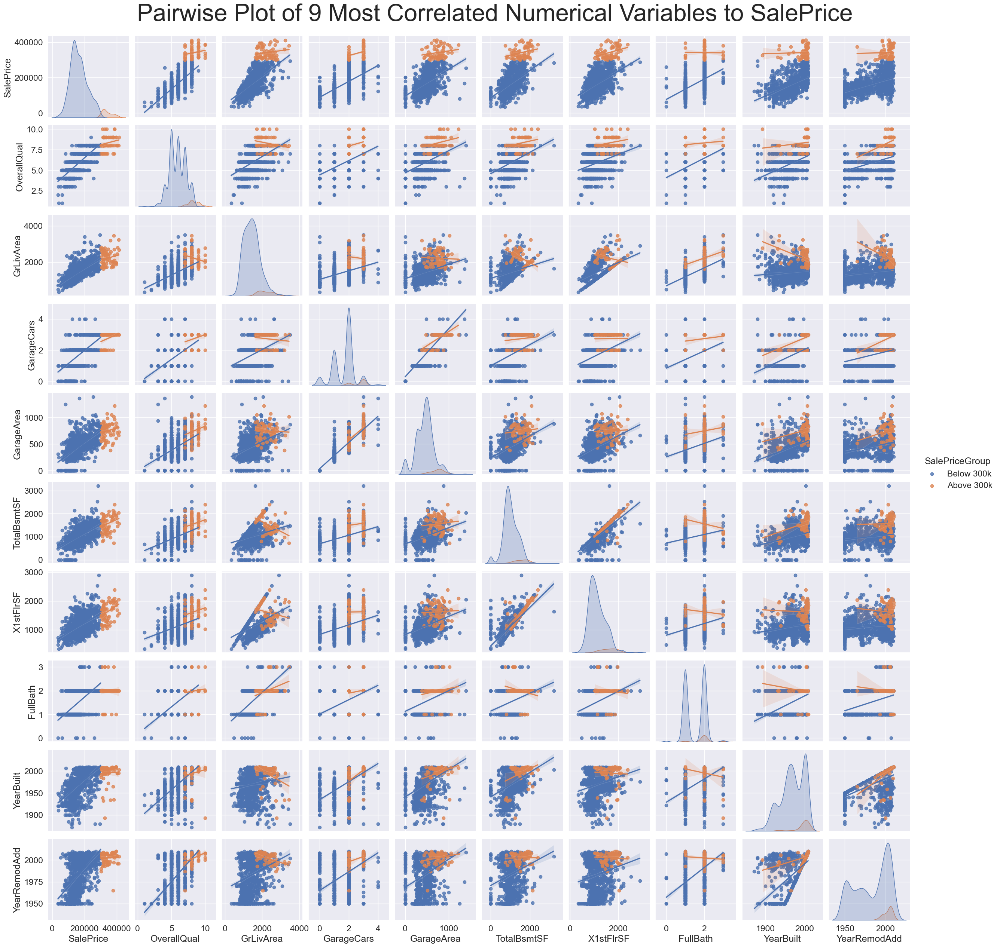

In [22]:
pair_cols = list(cols[:10])
pair_cols.append('SalePriceGroup')

# sns.set(font_scale=2)
sns.pairplot(filtered_df[pair_cols], kind='reg', hue='SalePriceGroup')
plt.suptitle("Pairwise Plot of 9 Most Correlated Numerical Variables to SalePrice", y = 1.02, fontsize = 46)

- From SalePrice and YearBuilt, we could see that the number of houses are increasing exponentially throughout the years. Houses with price above 300k is very rare in the past, but it is increasing rapidly in the recent years. From the scatter points, cheap houses are getting lesser and lesser. Thus, it means that houses price are getting more expensive over the years.
- However, if we look at the GrLivArea and YearBuilt, there are not much houses with large above ground living area in the past. Generally, houses with large area is cheaper in the past compared to recent years where high GrLivArea in recent years are covered by orange points which have price above 300k. Recently, more houses with large area are built with expensive price, which explains the relationship between GrLivArea and SalePrice.
- It could also be seen that from the scatter plot between the 10 most correlated variables to SalePrice, relationship between each variable pair are proportionally related to SalePrice. It shows that houses with expensive price have a tendency to have higher value of variable pair.

### Violin Plots of Numerical Variables between Expensive and Cheap Houses

We will compare the difference of distribution between Houses with price below and above 300k using violin plot, where the Y axis shows 2 different SalePriceGroup and the X axis shows the numerical variable with its value range. 

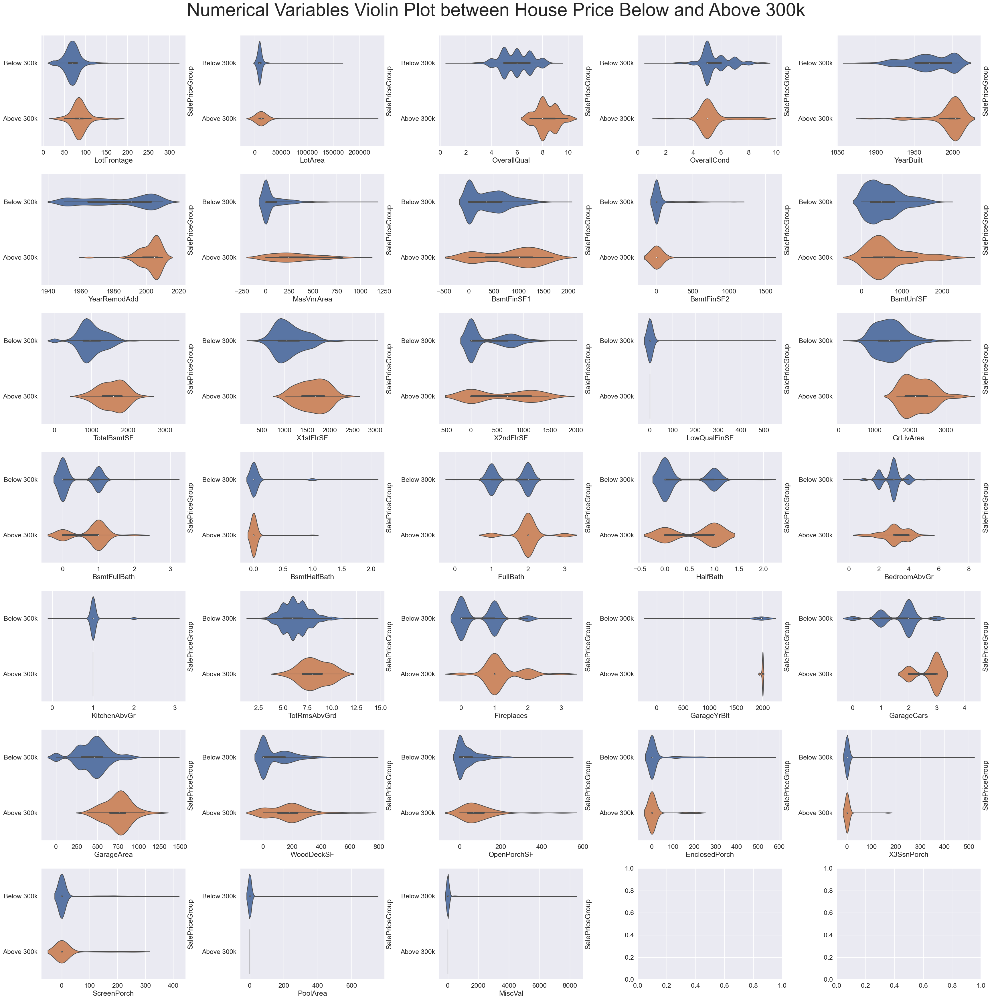

In [23]:
num_noprice = num_var[:-1]
fig_rows = 7
fig_cols = 5

fig, ax = plt.subplots(fig_rows, fig_cols, figsize=(fig_cols*7, fig_rows*5))

for i in range(fig_rows):
    for j in range(fig_cols):
        n = i*fig_cols+j
        if i < len(num_noprice):
            try:
                var = num_noprice[n]
                sns.violinplot(x=var, y='SalePriceGroup', data=filtered_df, ax = ax[i][j])
                ax[i][j].yaxis.set_label_position("right")
            except IndexError:
                pass


plt.suptitle("Numerical Variables Violin Plot between House Price Below and Above 300k", y = 1.00, fontsize = 46)
plt.tight_layout()
plt.show()

We can see significant differences between the two groups in several variables:
- OverallQual: supports heatmap finding, higher price group lies on the better overall quality range.
- MasVnrArea: most of lower price group do not have MasVnr or area equals to 0.
- BsmtFinSF1: higher price group tends to have larger finished Basement Type 1 area. While most of lower group does not have this feature (area equals to 0)
- Areas Variables (GrLivArea, BsmtFinSF1, TotalBsmtSF, 1stFlrSF, 2ndFlrSF, GarageArea, GarageCars):
higher price group tends to have larger area for these features. While most of lower group have smaller area.
- Bathrooms Variables (BsmtFullBath, FullBath, HalfBath): higher price groups tends to have more bathrooms. Most of the houses (higher and lower price) do not have BsmtHalfBath (0 value is the fattest for this feature).
- WoodeckSF, OpenPorchSF: higher price groups tends to have this feature with area larger than 0, while most of the smaller prices group did not have this feature (area near 0), this might be because these features are tertiary and require some spaces in the house, so the price for this house is more expensive.
- Year Variables (YrBuilt and YrRemodAdd): There are more expensive houses built or remodeled in the recent years. while houses that are cheaper tends to be built or remodeled in the past.

Some similiarities:
- BsmtHalfBath, EnclosedPorch, 3SsnPorch: most of the houses have 0 area or rooms which means all houses in the dataset, mostly they do not have these features

Interesting point:
- OverallCond: most of the higher price group houses have the value 5 for the condition. It is the same with lower price group, but there are quite many houses in this group that also have value larger than 5. This explains that higher value for Overall Condition means the house will have higher price.

Looking at the diagonal distribution plots of the 10 variables including SalePrice, we could see that is not normal, with mostly are right-skewed. This will affect the performance of our model later, so we need to normalized it.

### Distribution Plots

First, let's see the distributions for the numerical variables by plotting the histplot of each variable.

In [24]:
skew_features = filtered_df[num_var[:-1]].apply(lambda x: x.skew()).sort_values(ascending=False)

skew_above = skew_features[skew_features > 0.5]
skew_cols = skew_above.index

print(f"Number of Numerical Variable (excluding SalePrice) with Skew > 0.5 : {skew_above.shape[0]}")
print(f"Skewness of SalePrice (target variable): {filtered_df['SalePrice'].skew()}")

skewness = pd.DataFrame({'Skew' :skew_above})
skewness

Number of Numerical Variable (excluding SalePrice) with Skew > 0.5 : 24
Skewness of SalePrice (target variable): 0.9688708326987444


,Skew
MiscVal,19.672427
PoolArea,17.574633
LotArea,13.736679
X3SsnPorch,10.288616
LowQualFinSF,8.701280
KitchenAbvGr,4.436803
BsmtFinSF2,4.209304
BsmtHalfBath,4.202685
ScreenPorch,3.938728
EnclosedPorch,3.125222


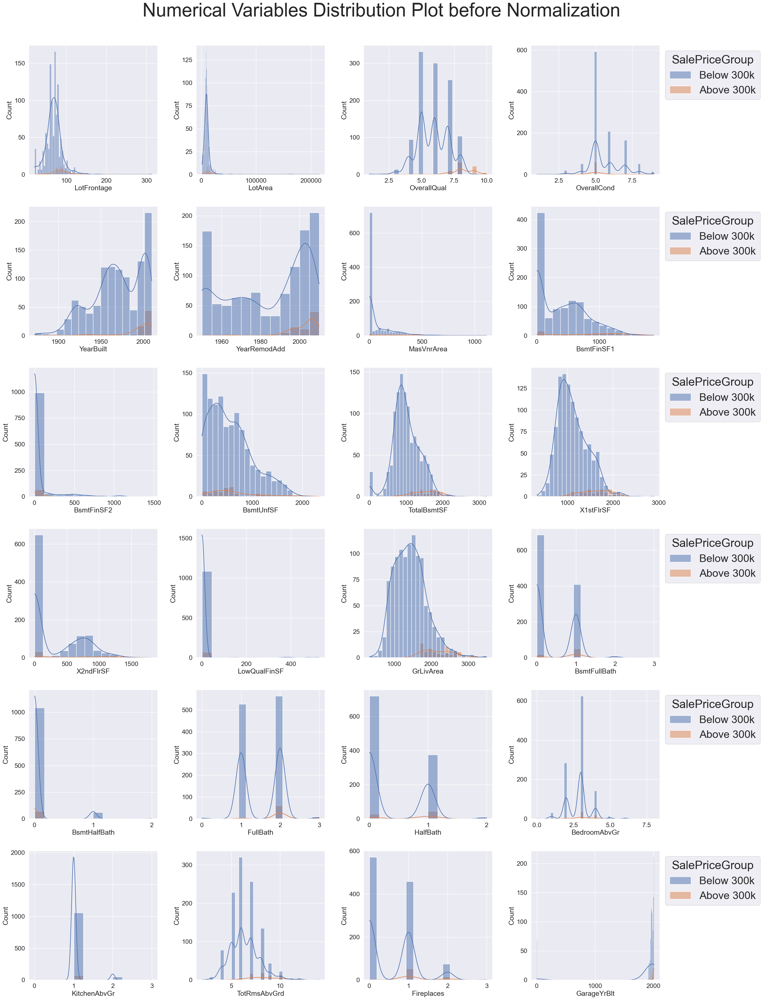

In [25]:
fig_rows = 6
fig_cols = 4

fig, ax = plt.subplots(fig_rows, fig_cols, figsize=(fig_cols*7, fig_rows*6))

for i in range(fig_rows):
    for j in range(fig_cols):
        n = i*fig_cols+j
        if i < len(num_var):
            try:
                var = num_var[n]
                sns.set(font_scale=2.5)
                if(j == 3):
                    hist = sns.histplot(data=filtered_df, x=var, ax = ax[i][j], kde=True, hue='SalePriceGroup')
                    sns.move_legend(hist, "upper left", bbox_to_anchor=(1, 1))
                else:
                    hist = sns.histplot(data=filtered_df, x=var, ax = ax[i][j], kde=True, hue='SalePriceGroup')
                    hist.legend_.remove()

            except IndexError:
                pass


plt.suptitle("Numerical Variables Distribution Plot before Normalization", y = 1.00, fontsize = 48)
plt.tight_layout()
plt.show()



Based on the distributions of the numerical variables, it can be seen that most of the variable are right-skewed, meaning that there are the mean, median, and mode are all on different spot. It is understandable because all the measurements are non-negative, so the lower bound is 0. Some of the variables can be seen from the table that it has really high positive skew.

With the added hue for price group, we can see that houses with blue color price group (below 300k) are the most frequent in the data since it has the largest proportion in the distribution of the 10 numerical variables plotted above.

On the other hand, the number of houses with price above 300000 is very low, showing that very expensive houses is not common in the dataset.

(Supports finding from the violin plot):
- For Years variable (YearBuilt and YearRemodAdd), the data are left-skewed, it shows that there are more houses built or remodeled in recent years than the past. 
- While some variables such as PoolArea, MiscVal, Porch variables, and MasVnrArea have the value 0 or near to 0 for most of the houses in the data, which means that these features are not common in the houses since the size is around 0.
- Based on the variables that explain some area of the house, it is clear that expensive houses (orange area) are distributed in the region that have larger area (GrLivArea, TotalBsmtSF, 1stFlrSF, GarageArea) with low peak which explains the little data of expensive houses.
- In the OverallQual variable, below 300k houses (blue area) are distributed below the 9 quality value. While the value 9 only contains houses with price above 300k. This support our finding from the heat map that shows a very strong correlation of OverallQual to the SalePrice.

### Normalization
- Since there are 24 numerical variables that have skewness larger than 0.5, we should transform these variable values to have an approximately normal distribution to eliminate significant differences in mean and variance that will be useful to reduce the error on our model when predicting prices later. It improves linearity between our features (dependent) and SalePrice (independent) variables.

We will use logarithm transformation for the SalePrice the other 24 numerical variables that have skewness > 0.5 because we care about the relative changes in the dependent and independent variables. Here we will use np.log1p that transform x to log(x + 1) because our data have 0, and only log(0) will result in undefined value.

In [26]:
normalized_df = filtered_df.copy()
normalized_df['SalePrice'] = np.log1p(filtered_df['SalePrice'])

for i in skew_above.index:
    normalized_df[i] = np.log1p(normalized_df[i])

In [27]:
num_var = list(num_var)
num_var.pop()
print(num_var)

['LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'X1stFlrSF', 'X2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', 'X3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal']


Now, we can assign the y target variable which is the normalized SalePrice, and drop it from the dataframe

In [28]:
y_log = normalized_df['SalePrice']
y_group_og = filtered_df[['SalePrice', 'SalePriceGroup']]
normalized_df.drop(['SalePrice', 'SalePriceGroup'], axis=1, inplace=True)
normalized_df

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,20,RH,4.110874,8.962007,Pave,None,Reg,Lvl,AllPub,Corner,...,0.000000,0.0,None,MnPrv,None,0.000000,7,2006,WD,Abnorml
1,20,RL,4.094345,9.316590,Pave,None,IR1,Lvl,AllPub,CulDSac,...,0.000000,0.0,None,None,None,0.000000,6,2008,WD,Normal
2,90,RL,4.276666,9.846441,Pave,None,IR1,Lvl,AllPub,Inside,...,0.000000,0.0,None,None,Gar2,9.024131,8,2007,WD,Normal
3,20,RL,4.477337,9.318926,Pave,None,IR1,Lvl,AllPub,Inside,...,0.000000,0.0,None,None,None,0.000000,7,2009,WD,Normal
4,20,RL,4.158883,9.047939,Pave,None,Reg,Lvl,AllPub,FR2,...,0.000000,0.0,None,None,None,0.000000,11,2007,WD,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1195,20,RL,4.276666,9.161255,Pave,None,IR1,HLS,AllPub,Inside,...,0.000000,0.0,None,None,None,0.000000,4,2008,New,Partial
1196,60,RL,4.262680,9.076923,Pave,None,Reg,Lvl,AllPub,Inside,...,0.000000,0.0,None,None,None,0.000000,6,2010,WD,Normal
1197,20,RL,4.276666,9.336268,Pave,None,IR1,Lvl,AllPub,Inside,...,4.564348,0.0,None,None,None,0.000000,5,2010,WD,Normal
1198,20,RL,4.189655,9.042040,Pave,None,Reg,Lvl,AllPub,Inside,...,0.000000,0.0,None,None,None,0.000000,4,2008,WD,Normal


### Categorical Variables Box Plot to SalePrice

Next, let's visualize a Box Plot for the categorical variables to see how it is related to the SalePrice.

In [29]:
print(f"There are: {len(cat_var)} Categorical Variables")

There are: 46 Categorical Variables


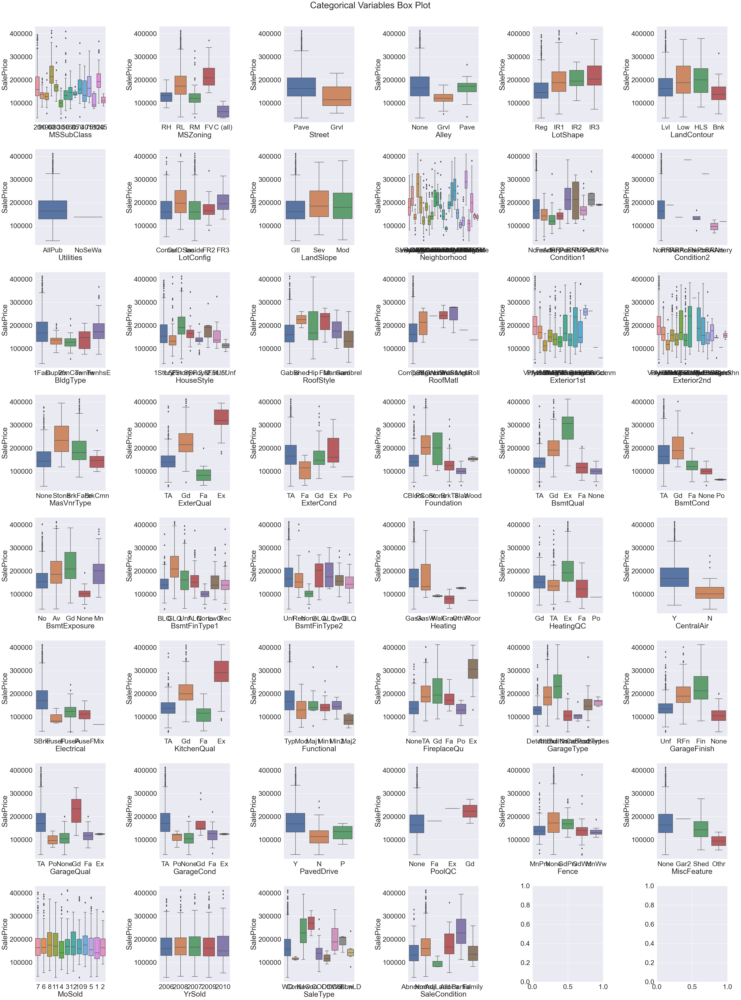

In [30]:
fig_rows = 8
fig_cols = 6

fig, ax = plt.subplots(fig_rows, fig_cols, figsize=(fig_cols*7, fig_rows*7))

for i in range(fig_rows):
    for j in range(fig_cols):
        n = i*fig_cols+j
        if i < len(cat_var):
            try:
                var = cat_var[n]
                sns.boxplot(x=var, y='SalePrice', data=filtered_df, ax = ax[i][j])
            except IndexError:
                pass


plt.suptitle("Categorical Variables Box Plot", y = 1.00, fontsize = 36)
plt.tight_layout()
plt.show()

From the boxplot, we can find some relationship between the values in the categorical variables compared to SalePrice:

Value that have higher Sale Price if present in a house than other value in the same category:
- MSZoning: FVC
- Street: Pave
- LotShape: IR3
- Have CentralAir
- Have PavedDrive

Quality or Condition Variables (ExterQual, ExterCond, BsmtQual, BsmtCond, HeatingQC, KitchenQual, FireplaceQu): 
- Better Grade have higher price, increasing price over the ranking value
- Anomaly: GarageQual and GarageCond  (rare for houses that have excellent, more houses have good grade with higher sale price)

In addition, we can see that some variables' category values:
- are really hard to distinguish to the SalePrice (multiple category values are distributed among the similar SalePrice range) such as ['Functional', 'MiscFeature', 'MoSold', 'YrSold']
- there is insufficient data that caused the boxplot of a categorical variable looks incomplete/poor such as ['Utilities', 'Condition2']

So we can drop these variables since it did not contain useful information for our prediction model.

In [31]:
print(len(cat_var))

drop_cat_var = ['Utilities', 'Condition2', 'Functional', 'MiscFeature', 'MoSold', 'YrSold']
print(len(drop_cat_var))
new_cat_var = list(set(cat_var) - set(drop_cat_var))
print(len(new_cat_var))

print(f"We drop {len(drop_cat_var)} variables and left with {len(new_cat_var)} Categorical Variables")

46
6
40
We drop 6 variables and left with 40 Categorical Variables


### Encoding Categorical Variables

For further process which is PCA for dimension reduction, we need to convert these categorical variables into numerical by using encoding which transform the category values in each categorical variable.

Categorical variables are separated to Nominal and Ordinal, since it will require different encoding process later. From the definition, we can manually select variables that have no rankings/order as Nominal Variables and variables that are in the form of ranking (i.e. Poor, Fair, Average, Good, Excellent) as Ordinal Variables with the reference to the data_description.txt provided.

In [32]:
nom_cat = ['MSSubClass', 'MSZoning','Street','Alley','LotConfig','LandContour','Neighborhood','Condition1',
                'BldgType','HouseStyle','RoofStyle','RoofMatl','Exterior1st','Exterior2nd','MasVnrType',
                'Foundation','Heating','CentralAir','GarageType','SaleType', 'SaleCondition']
print(f"There are: {len(nom_cat)} Nominal Variables\n{nom_cat}\n")

ord_cat = ['LotShape','LandSlope','ExterQual','ExterCond','BsmtQual','BsmtCond','BsmtExposure',
                'BsmtFinType1','BsmtFinType2','HeatingQC','Electrical','KitchenQual','FireplaceQu',
                'GarageQual', 'GarageCond', 'GarageFinish','PavedDrive', 'PoolQC', 'Fence']
print(f"There are: {len(ord_cat)} Ordinal Variables\n{ord_cat}")

There are: 21 Nominal Variables
['MSSubClass', 'MSZoning', 'Street', 'Alley', 'LotConfig', 'LandContour', 'Neighborhood', 'Condition1', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'Foundation', 'Heating', 'CentralAir', 'GarageType', 'SaleType', 'SaleCondition']

There are: 19 Ordinal Variables
['LotShape', 'LandSlope', 'ExterQual', 'ExterCond', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'HeatingQC', 'Electrical', 'KitchenQual', 'FireplaceQu', 'GarageQual', 'GarageCond', 'GarageFinish', 'PavedDrive', 'PoolQC', 'Fence']


In [33]:
#One hot encoding for nominal variables
from sklearn.preprocessing import OneHotEncoder
import category_encoders as ce

nom_encoder = OneHotEncoder(sparse=False, handle_unknown='ignore', drop='if_binary')
nom_encoded = nom_encoder.fit_transform(normalized_df[nom_cat])

nom_encoded_df = pd.DataFrame(nom_encoded, columns=nom_encoder.get_feature_names_out())

#Ordinal encoding for ordinal variables
ordinal_mappings = {
    'LotShape': ['Reg', 'IR1', 'IR2', 'IR3'],
    'LandSlope': ['Gtl', 'Mod', 'Sev'],
    'ExterQual': ['Ex', 'Gd', 'TA', 'Fa', 'Po'],
    'ExterCond': ['Ex', 'Gd', 'TA', 'Fa', 'Po'],
    'BsmtQual': ['Ex', 'Gd', 'TA', 'Fa', 'Po', 'None'], 
    'BsmtCond': ['Ex', 'Gd', 'TA', 'Fa', 'Po', 'None'],
    'BsmtExposure': ['Gd', 'Av', 'Mn', 'No', 'None'],
    'BsmtFinType1': ['GLQ', 'ALQ' , 'BLQ', 'Rec', 'LwQ', 'Unf', 'None'], 
    'BsmtFinType2': ['GLQ', 'ALQ' , 'BLQ', 'Rec', 'LwQ', 'Unf', 'None'], 
    'HeatingQC': ['Ex', 'Gd', 'TA', 'Fa', 'Po'], 
    'Electrical': ['SBrkr', 'FuseA', 'FuseF', 'FuseP', 'Mix'],
    'KitchenQual': ['Ex', 'Gd', 'TA', 'Fa', 'Po'],
    'FireplaceQu': ['Ex', 'Gd', 'TA', 'Fa', 'Po', 'None'],
    'GarageQual': ['Ex', 'Gd', 'TA', 'Fa', 'Po', 'None'],
    'GarageCond': ['Ex', 'Gd', 'TA', 'Fa', 'Po', 'None'],
    'GarageFinish': ['Fin', 'RFn', 'Unf', 'None'],
    'PavedDrive': ['Y', 'P', 'N'],
    'PoolQC': ['Ex', 'Gd', 'TA', 'Fa', 'None'],
    'Fence': ['GdPrv', 'MnPrv', 'GdWo', 'MnWw', 'None']
}

ce_ordinal_mappings = []
for col, unique_values in ordinal_mappings.items():
    local_mapping = {val:idx for idx, val in enumerate(unique_values)}
    ce_ordinal_mappings.append({"col":col, "mapping":local_mapping})

ord_encoder = ce.OrdinalEncoder(mapping=ce_ordinal_mappings, return_df=True)
ord_encoded_df = ord_encoder.fit_transform(normalized_df[ord_cat])

train_encoded_df = pd.concat([normalized_df[num_var].reset_index(drop=True), nom_encoded_df.reset_index(drop=True), ord_encoded_df.reset_index(drop=True)], axis=1)
train_encoded_df

,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,...,HeatingQC,Electrical,KitchenQual,FireplaceQu,GarageQual,GarageCond,GarageFinish,PavedDrive,PoolQC,Fence
0,4.110874,8.962007,5,1.791759,1965,1965,0.000000,6.464588,0.000000,5.236442,...,1,0,2,5,2,2,2,0,4,1
1,4.094345,9.316590,6,1.945910,1984,1984,0.000000,6.493754,0.000000,6.350886,...,2,0,2,5,2,2,2,0,4,4
2,4.276666,9.846441,5,1.791759,1977,1977,0.693147,6.212606,5.356586,6.481577,...,0,0,2,2,2,2,1,2,4,4
3,4.477337,9.318926,8,1.791759,2006,2006,5.525453,0.000000,0.000000,7.444249,...,0,0,1,1,2,2,1,0,4,4
4,4.158883,9.047939,7,1.791759,2004,2004,4.672829,0.000000,0.000000,7.260523,...,0,0,1,5,2,2,1,0,4,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1174,4.276666,9.161255,8,1.791759,2007,2008,5.826000,7.322510,0.000000,4.836282,...,0,0,1,1,2,2,1,0,4,4
1175,4.262680,9.076923,6,1.791759,1998,1998,4.762174,6.226537,0.000000,5.703782,...,0,0,1,5,2,2,1,0,4,4
1176,4.276666,9.336268,5,1.945910,1957,1996,5.198497,7.172425,0.000000,4.510860,...,2,0,2,1,2,2,2,0,4,4
1177,4.189655,9.042040,7,1.791759,2004,2004,5.587249,6.853299,0.000000,6.196444,...,0,0,1,5,2,2,2,0,4,4


Now, our train dataset have 214 columns (from 79) after we transform all the categorical variables into numerical.

### Dimension Reduction

## Principal Component Analysis Dimension Reduction

### Standard Scaling
Before we reduce the dimension of our variables using Principal Component, we need to scale our data because PCA calculates a new projection of our data on a new axis using the standard deviation of our data. So it is important to scale our data since our 213 variables is not within the same scale yet that could result in inacurrate detection for the feature importance, since the principal components will be biased towards features with high variance.

In [34]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
train_df_scaled = scaler.fit_transform(train_encoded_df)

X_train_scaled = pd.DataFrame(train_df_scaled, columns = train_encoded_df.columns)

First, let's see the PCA result for train dataset that is reduced from 213 to 10 components.

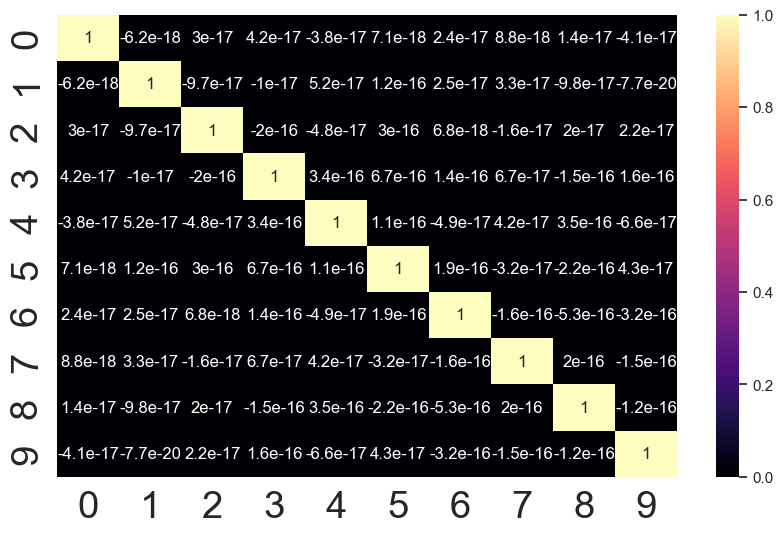

In [35]:
from sklearn.decomposition import PCA
pca = PCA(n_components=10)
X_train_scaled_pca =pca.fit_transform(X_train_scaled)

X_train_scaled_pca_df = pd.DataFrame(X_train_scaled_pca)

plt.subplots(figsize=(10,6))

sns.set(font_scale=1)
sns.heatmap(X_train_scaled_pca_df.corr(), annot=True, cmap='magma');

The heatmap shows that our PCA works. There is no correlation between each component which is suitable for our reggression model since each feature will be independent when explaining the variation to SalePrice (target).

In [36]:
print("Component N : Explained Variance Ratio")
for i in range(1, 11):
    print(f"Component {i}: {pca.explained_variance_ratio_[i-1]}")

pca_df = pd.DataFrame({'PCA':pca.components_[0], 'Variable Names':list(X_train_scaled.columns)})
pca_df = pca_df.sort_values('PCA', ascending=False)

pca_df2 = pd.DataFrame(pca_df)
pca_df2['PCA']=pca_df2['PCA'].apply(np.absolute)
pca_df2 = pca_df2.sort_values('PCA', ascending=False)

pca_df2

Component N : Explained Variance Ratio
Component 1: 0.07323933368410102
Component 2: 0.03722656265286923
Component 3: 0.030922237571193605
Component 4: 0.02404783930189723
Component 5: 0.02313365487040057
Component 6: 0.02067934677624626
Component 7: 0.019828081074847976
Component 8: 0.016807143812396452
Component 9: 0.015505366022955734
Component 10: 0.014083042070461719


,PCA,Variable Names
4,0.209777,YearBuilt
2,0.193676,OverallQual
210,0.187370,GarageFinish
24,0.183630,GarageCars
197,0.182790,ExterQual
...,...,...
212,0.000926,PoolQC
16,0.000739,BsmtHalfBath
165,0.000311,Foundation_Wood
173,0.000255,GarageType_2Types


In [37]:
pca_df = pd.DataFrame({'PCA':pca.components_[1], 'Variable Names':list(X_train_scaled.columns)})
pca_df = pca_df.sort_values('PCA', ascending=False)

pca_df2 = pd.DataFrame(pca_df)
pca_df2['PCA']=pca_df2['PCA'].apply(np.absolute)
pca_df2 = pca_df2.sort_values('PCA', ascending=False)

pca_df2

,PCA,Variable Names
12,0.227673,X2ndFlrSF
161,0.198832,Foundation_CBlock
37,0.196423,MSSubClass_20
110,0.196352,HouseStyle_2Story
51,0.189949,MSZoning_RL
...,...,...
72,0.001882,Neighborhood_Crawfor
4,0.001486,YearBuilt
59,0.001454,LotConfig_FR2
122,0.000810,RoofMatl_Roll


As we can see, the first PCA Component can only explain around 0.0735 variance, with YearBuilt as the most important variable.

Text(83.69534375000002, 0.5, 'PCA Component 2')

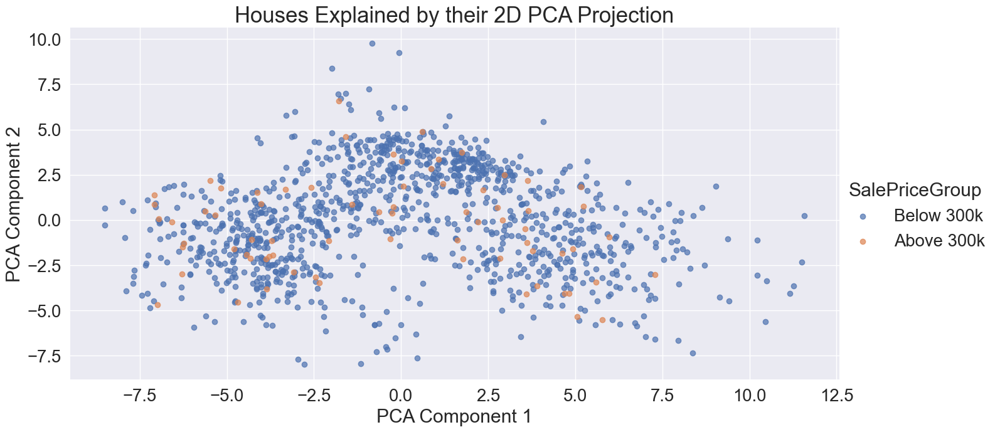

In [38]:
df_pca = pd.DataFrame({'PCA1':X_train_scaled_pca[:, 0], 'PCA2':X_train_scaled_pca[:, 1]})

df_combine_pca=pd.concat([df_pca, y_group_og] ,axis =1)

sns.set(font_scale = 1.8)
sns.lmplot(x="PCA1",y="PCA2", hue = 'SalePriceGroup', data=df_combine_pca, fit_reg=False, height=7, aspect=2, scatter_kws={'alpha':0.7})

plt.title("Houses Explained by their 2D PCA Projection", size=25)
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")

In [39]:
variance_ratio = pca.explained_variance_ratio_
np.cumsum(variance_ratio)[1]

0.11046589633697024

From the first two PCA Components: PCA Component 1 and PCA Component 2, we can plot a scatter plot to see if we can see that it can help to identify the houses which variables reduced only two 2 components. However, the result of the 2D Projection is very spread, and we cannot identify the SalePrice of each houses. This is understandable since Component 1 only have 0.07355936885394805 explained variance ratio and
Component 2 has 0.03738798504266567, only account for 0.11094735389661373 cumulative sum explained variance ratio which is a very small number.

So, we need to find the optimal number of PCA Components that can explain most of the variance by counting the Cumulative Sum of the Explained Variance Ratio and keep track of the number of component. Here, we will set for the CumSum of Explained Variance Ratio to reach 95%.

N_Components when Explained Variance Ratio reach 95%: 130


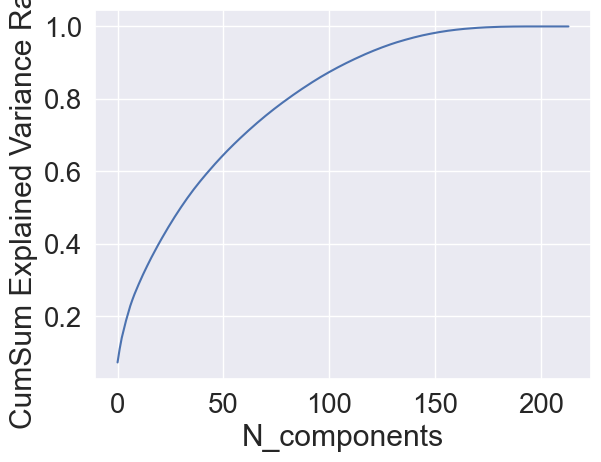

In [40]:
all_pca = PCA()
X_train_scaled_all_pca = all_pca.fit_transform(X_train_scaled)

X_train_scaled_pca_df = pd.DataFrame(X_train_scaled_pca)

variance_ratio = all_pca.explained_variance_ratio_
cum_sum_variance_ratio = np.cumsum(variance_ratio)
pca_n_com = X_train_scaled_all_pca.shape[1]
x_axis = np.arange(pca_n_com)

plt.xlabel("N_components")
plt.ylabel("CumSum Explained Variance Ratio")

plt.plot(x_axis, cum_sum_variance_ratio)

for i in range(pca_n_com):
    if cum_sum_variance_ratio[i] >= 0.95:
        num_pca = i + 1
        print(f"N_Components when Explained Variance Ratio reach 95%: {num_pca}")
        break

pca = PCA(n_components=num_pca)
X_train_scaled_pca =pca.fit_transform(X_train_scaled)

X_train_scaled_pca_df = pd.DataFrame(X_train_scaled_pca)

Here, we get that the PCA reached explained variance ratio of 95% at N_components = 130, so we will arrange a new PCA with n_components = 130 before feeding it into the model

Regression and Prediction

Before we train our model, let's load the test data and apply the same treatment that we did to train data without the outlier removal (fill missing values, normalization, categorical variables encoding).

In [41]:
test_df = pd.read_csv('housing_test.csv')

test_id = test_df['Id']

percent_null = (test_df.isnull().sum() / len(test_df)) * 100
percent_null = percent_null[percent_null != 0].sort_values(ascending = False)

test_df['PoolQC'].fillna('None', inplace=True)

fill_with_none_cols = ['MiscFeature', 'Alley', 'Fence', 'FireplaceQu',
                        'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond',
                        'BsmtExposure', 'BsmtFinType2', 'BsmtCond', 'BsmtFinType1', 'BsmtQual',
                        'MasVnrType']
                        
for feature_name in fill_with_none_cols:
    test_df[feature_name].fillna('None', inplace=True)

fill_with_zero = ['GarageYrBlt', 'MasVnrArea']

for feature_name in fill_with_zero:
    test_df[feature_name].fillna(0, inplace=True)

test_df['LotFrontage'] = test_df.groupby('Neighborhood')['LotFrontage'].transform(lambda x: x.fillna(x.mean()))
test_df['Electrical'] = test_df['Electrical'].fillna('SBrkr')

percent_null = (test_df.isnull().sum() / len(test_df)) * 100
percent_null = percent_null[percent_null != 0].sort_values(ascending = False)
print(f"Checking Remaining Null: {percent_null}")

test_df['MSSubClass'] = test_df['MSSubClass'].apply(str)
test_df['YrSold'] = test_df['YrSold'].astype(str)
test_df['MoSold'] = test_df['MoSold'].astype(str)

test_normalized_df = test_df.copy()
test_normalized_df.drop('Id', axis=1, inplace=True)

test_normalized_df['SalePrice'] = np.log1p(test_normalized_df['SalePrice'])
y_test = test_normalized_df['SalePrice']

test_normalized_df.drop(['SalePrice'], axis=1, inplace=True)

test_skew_features = test_normalized_df[num_var].apply(lambda x: x.skew()).sort_values(ascending=False)

test_high_skew = test_skew_features[skew_features > 0.5]
test_skew_above = test_high_skew.index

for i in test_skew_above:
    test_normalized_df[i] = np.log1p(test_normalized_df[i])

test_nom_encoded = nom_encoder.transform(test_normalized_df[nom_cat])
test_nom_encoded_df = pd.DataFrame(test_nom_encoded, columns=nom_encoder.get_feature_names_out())

test_ord_encoded_df = ord_encoder.transform(test_normalized_df[ord_cat])

test_encoded_df = pd.concat([test_normalized_df[num_var].reset_index(drop=True), test_nom_encoded_df.reset_index(drop=True), test_ord_encoded_df.reset_index(drop=True)], axis=1)
test_encoded_df

Checking Remaining Null: Series([], dtype: float64)


,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,...,HeatingQC,Electrical,KitchenQual,FireplaceQu,GarageQual,GarageCond,GarageFinish,PavedDrive,PoolQC,Fence
0,4.510860,9.211640,4,1.791759,1972,1972,0.000000,6.825460,5.198497,3.663562,...,2,0,2,5,2,2,1,0,4,1
1,4.325456,9.455089,6,2.197225,1960,1998,0.000000,6.212606,0.000000,6.133398,...,2,0,2,5,2,2,1,0,4,4
2,4.219508,9.091332,4,1.945910,1938,1958,0.000000,6.538140,0.000000,4.844187,...,0,0,2,1,3,3,2,0,4,4
3,3.218876,8.502891,6,1.945910,1976,1976,0.000000,6.865891,0.000000,0.000000,...,2,0,2,5,2,2,1,0,4,4
4,3.713572,8.361942,5,1.945910,1913,2002,0.000000,5.902633,0.000000,4.330733,...,2,0,1,1,1,2,2,1,4,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
255,3.637586,8.397508,6,1.791759,2004,2004,5.135798,6.496775,0.000000,5.231109,...,0,0,1,1,2,2,1,0,4,4
256,4.454347,9.210440,8,1.791759,2006,2006,6.018593,0.000000,0.000000,7.370860,...,0,0,1,1,2,2,1,0,4,4
257,4.120198,8.922792,6,2.079442,1942,1950,0.000000,6.306275,0.000000,5.416100,...,3,0,1,1,2,2,2,1,4,4
258,4.406719,9.405167,5,1.791759,1954,1954,5.817111,0.000000,0.000000,6.957497,...,0,2,2,5,3,2,2,0,4,4


Check if the number of columns in train data == columns in test data

In [42]:
print(train_encoded_df.shape[1] == test_encoded_df.shape[1])

True


Transforming test_encoded_df with standard scaler and PCA dimension reduction based on the train data

In [43]:
test_df_scaled = scaler.transform(test_encoded_df)
X_test_scaled = pd.DataFrame(test_df_scaled, columns = test_encoded_df.columns)
X_test_scaled_pca =pca.transform(X_test_scaled)
X_test_scaled_pca_df = pd.DataFrame(X_test_scaled_pca)

Let's build our regresion model, first we define the function for 5-fold Cross Validation technique and for computing the Root Mean Squared Error (RMSE)

In [44]:
from sklearn.model_selection import KFold, cross_val_score
from sklearn.metrics import mean_squared_error

k_folds = 5

kf = KFold(n_splits=k_folds, random_state=42, shuffle=True) #initialize 5 fold Cross Validation

def log_rmse(y, y_pred): # function to calculate RMSE (in log)
    return np.sqrt(mean_squared_error(y, y_pred))

def cv_rmse(model): # returns array of 5 fold CV RMSE score
    rmse = np.sqrt(-cross_val_score(model, X_train_scaled_pca_df.values, y_log, scoring="neg_mean_squared_error", cv=kf))
    print(f"RMSE from 5 fold CV: {rmse}")
    return (rmse)

Then, we import the required libraries for our 3 models, in this project we select XGBoost Regressor, Support Vector Machine (SVM) Regressor, and Random Forest Regressor

- Linear Regression: Most Common Model for Regression Problem
- XGBoost Regressor: Built based on Decision Tree, Most Famous Algorithm since it is fast and effective, and also applies L1(Lasso) and L2(Ridge) regularization to prevent overfitting.
- SVM Regressor: Maximum margin estimator. Robust to outliers and have decent generalization capability, suitable with small dataset.

In [45]:
from sklearn.pipeline import make_pipeline

from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor

Then, we make a function to extract the houses Id with the worst error from real price (above_real: largest positive error, under_real: largest negative error) and the good results (near 0 error) to be called for every model type and combined to analyze the characteristics for the worst house price prediction.

In [46]:
id = np.array(test_id)
arr_y_test = np.array(y_test)

def get_worst_id(y_pred):

    error = y_pred - arr_y_test # prediction price - real price

    matrix_aux = np.vstack([id, arr_y_test, y_pred, error])
    matrix     = np.transpose(matrix_aux)
    error_df = pd.DataFrame(matrix, columns=['Id', 'y_test', 'y_pred', 'error']) #construct error_df with selected columns

    error_df['Id'] = error_df['Id'].astype('int64')

    above_real = error_df[error_df['error'] > 0] # select specific category with conditions
    under_real = error_df[error_df['error'] < 0]
    error_df['abs'] = error_df['error'].abs()
    

    above_id = above_real.nlargest(10, 'error')[['Id', 'error']] # 10 largest positive error
    under_id = under_real.nsmallest(10, 'error')[['Id', 'error']] # 10 largest negative error
    closest_zero_id = error_df.nsmallest(10, 'abs')[['Id', 'error']] # 10 nearest to 0 error

    # print(above_id)
    # print(under_id)
    # print(closest_zero_id)

    above_id = above_id[['Id']]
    under_id = under_id[['Id']]
    closest_zero_id = closest_zero_id[['Id']]

    return above_id, under_id, closest_zero_id

In [47]:
import lazypredict
from lazypredict.Supervised import LazyRegressor
import sklearn
import xgboost
import lightgbm
# Get the list of available regression models
lazypredict.Supervised.REGRESSORS = [('AdaBoostRegressor', sklearn.ensemble._weight_boosting.AdaBoostRegressor),
                                    ('BayesianRidge', sklearn.linear_model._bayes.BayesianRidge),
                                    ('DecisionTreeRegressor', sklearn.tree._classes.DecisionTreeRegressor),
                                    ('ElasticNetCV', sklearn.linear_model._coordinate_descent.ElasticNetCV),
                                    ('ExtraTreesRegressor', sklearn.ensemble._forest.ExtraTreesRegressor),
                                    ('GradientBoostingRegressor', sklearn.ensemble._gb.GradientBoostingRegressor),
                                    ('Lars', sklearn.linear_model._least_angle.Lars),
                                    ('LassoCV', sklearn.linear_model._coordinate_descent.LassoCV),
                                    ('LinearRegression', sklearn.linear_model._base.LinearRegression),
                                    ('LinearSVR', sklearn.svm._classes.LinearSVR),
                                    ('RandomForestRegressor', sklearn.ensemble._forest.RandomForestRegressor),
                                    ('RidgeCV', sklearn.linear_model._ridge.RidgeCV),
                                    ('SGDRegressor', sklearn.linear_model._stochastic_gradient.SGDRegressor),
                                    ('TransformedTargetRegressor',
                                    sklearn.compose._target.TransformedTargetRegressor),
                                    ('XGBRegressor', xgboost.sklearn.XGBRegressor),
                                    ('LGBMRegressor', lightgbm.sklearn.LGBMRegressor)]

# Initialize the LazyRegressor object and fit the models
reg = LazyRegressor(verbose=0, ignore_warnings=True, custom_metric=None)
models, predictions = reg.fit(X_train_scaled_pca, X_test_scaled_pca, y_log, y_test)

# Print the model performance metrics
print(models.head(10))

100%|██████████| 16/16 [00:16<00:00,  1.02s/it]

                            Adjusted R-Squared  R-Squared  RMSE  Time Taken
Model                                                                      
LassoCV                                   0.79       0.90  0.13        0.14
ElasticNetCV                              0.79       0.90  0.13        0.15
RidgeCV                                   0.78       0.89  0.13        0.07
LinearRegression                          0.78       0.89  0.13        0.05
TransformedTargetRegressor                0.78       0.89  0.13        0.05
Lars                                      0.78       0.89  0.13        0.03
BayesianRidge                             0.78       0.89  0.13        0.07
SGDRegressor                              0.77       0.89  0.13        0.01
LGBMRegressor                             0.76       0.88  0.14        0.17
ExtraTreesRegressor                       0.75       0.88  0.14        2.05


### Linear Regression Model

RMSE from 5 fold CV: [0.133805   0.13641702 0.12801629 0.14280086 0.12756606]
5-fold CV Score
Mean RMSE: 0.1337
STD: 0.0057

Train R2 score: 0.9285 

RMSE on y_test: 0.1322
Test R2 score: 0.8912 



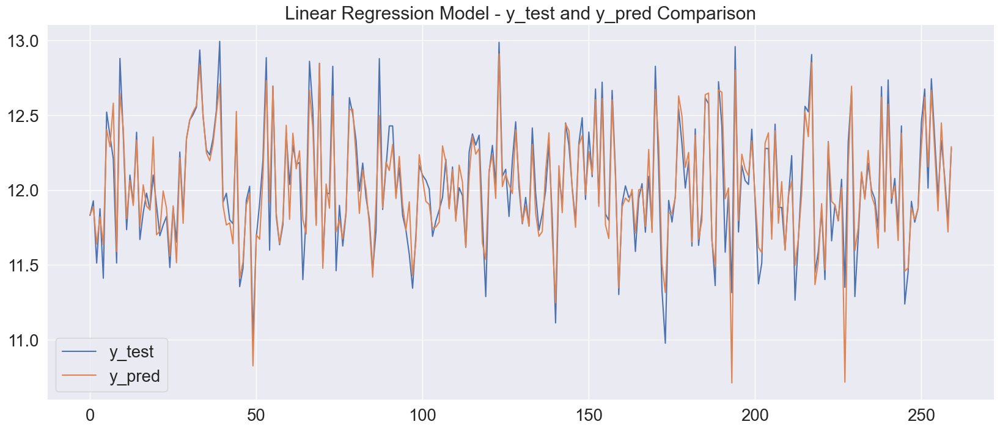

In [48]:
linreg = LinearRegression()
score = cv_rmse(linreg)

print(f"5-fold CV Score\nMean RMSE: {score.mean():.4f}\nSTD: {score.std():.4f}\n")

linreg.fit(X_train_scaled_pca, y_log)
print(f"Train R2 score: {linreg.score(X_train_scaled_pca, y_log):.4f} \n")

y_pred = linreg.predict(X_test_scaled_pca)

rmse = log_rmse(y_test, y_pred)
print(f"RMSE on y_test: {rmse:.4f}")
print(f"Test R2 score: {linreg.score(X_test_scaled_pca, y_test):.4f} \n")


x_ax = range(len(y_test))
plt.figure(figsize=(20,8))
plt.plot(x_ax, y_test, label="y_test")
plt.plot(x_ax, y_pred, label="y_pred")
plt.title("Linear Regression Model - y_test and y_pred Comparison")
plt.legend()
plt.show()

linreg_above, linreg_under, linreg_good = get_worst_id(y_pred)

### SVM Regressor Model

RMSE from 5 fold CV: [0.10949629 0.11676741 0.12121132 0.1121087  0.13027117]
5-fold CV Score
Mean RMSE: 0.1180
STD: 0.0073

Train R2 score: 0.9374 

RMSE on y_test: 0.1240
Test R2 score: 0.9043 



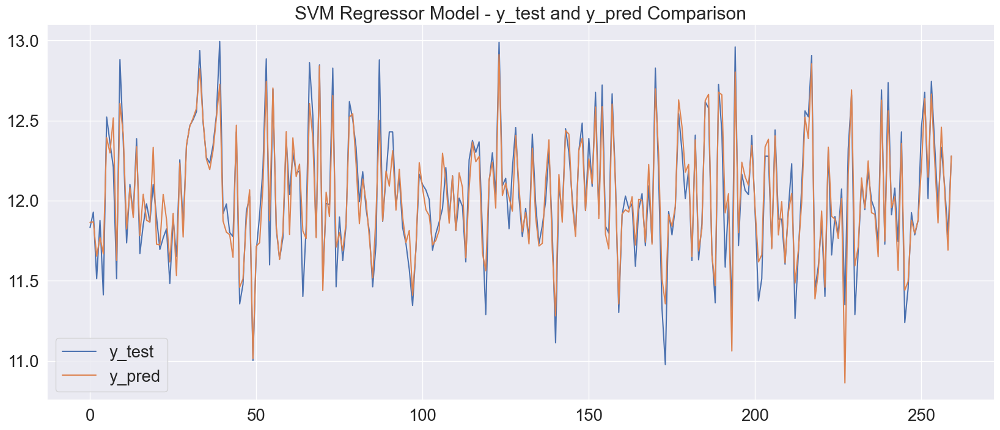

In [49]:
svr = make_pipeline(SVR(C=3, epsilon=0.05, gamma=0.0003, kernel='rbf'))
# C: L2 Penalty

score = cv_rmse(svr)

print(f"5-fold CV Score\nMean RMSE: {score.mean():.4f}\nSTD: {score.std():.4f}\n")

svr.fit(X_train_scaled_pca, y_log)
print(f"Train R2 score: {svr.score(X_train_scaled_pca, y_log):.4f} \n")

y_pred = svr.predict(X_test_scaled_pca)

rmse = log_rmse(y_test, y_pred)
print(f"RMSE on y_test: {rmse:.4f}")
print(f"Test R2 score: {svr.score(X_test_scaled_pca, y_test):.4f} \n")

x_ax = range(len(y_test))
plt.figure(figsize=(20,8))
plt.plot(x_ax, y_test, label="y_test")
plt.plot(x_ax, y_pred, label="y_pred")
plt.title("SVM Regressor Model - y_test and y_pred Comparison")
plt.legend()
plt.show()

svr_above, svr_under, svr_good = get_worst_id(y_pred)

RMSE from 5 fold CV: [0.130625   0.13713758 0.15168106 0.13357475 0.16143524]
5-fold CV Score
Mean RMSE: 0.1429
STD: 0.0118

Train R2 score: 0.9961 

RMSE on y_test: 0.1354
Test R2 score: 0.8859 



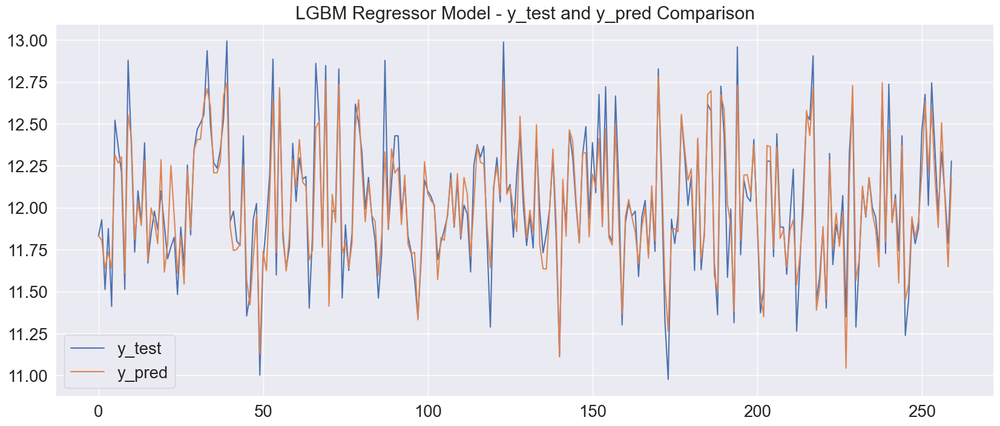

In [50]:
lgbm = make_pipeline(LGBMRegressor(n_estimators=1000, learning_rate=0.01, max_depth=20))

score = cv_rmse(lgbm)

print(f"5-fold CV Score\nMean RMSE: {score.mean():.4f}\nSTD: {score.std():.4f}\n")

lgbm.fit(X_train_scaled_pca, y_log)
print(f"Train R2 score: {lgbm.score(X_train_scaled_pca, y_log):.4f} \n")

y_pred = lgbm.predict(X_test_scaled_pca)

rmse = log_rmse(y_test, y_pred)
print(f"RMSE on y_test: {rmse:.4f}")
print(f"Test R2 score: {lgbm.score(X_test_scaled_pca, y_test):.4f} \n")

x_ax = range(len(y_test))
plt.figure(figsize=(20,8))
plt.plot(x_ax, y_test, label="y_test")
plt.plot(x_ax, y_pred, label="y_pred")
plt.title("LGBM Regressor Model - y_test and y_pred Comparison")
plt.legend()
plt.show()

lgbm_above, lgbm_under, lgbm_good = get_worst_id(y_pred)

Based on the test result of our 3 models, SVM Regressor Model have the best performance when predicting house price using test data. It has RMSE of 0.1240 and R^2 Score of 0.9044 on test data. This R^2 Score means that around 90.44% of the variance observed in the test data can be explained by the SVM Regressor Model. In addition, this model performs good on training data with 0.1183 Mean RMSE after 5 Fold Cross Validation for train data and 0.9364 R^2 score.

### Finding Characteristics of Houses with Worst Predictions
Using the result from get_worst_id function from each model, we get the Id of houses with worst predictions (over price or under price) and houses with good predictions (error near 0).

Then we merge it together into the original test data which has all variables, while dropping the Id duplicates (since the result from the 3 models could have duplicates) and assign labels to each house Id according to its Prediction Category.

In [51]:
above_id = pd.concat([linreg_above, svr_above, lgbm_above], ignore_index=True).drop_duplicates()
under_id = pd.concat([linreg_under, svr_under, lgbm_under], ignore_index=True).drop_duplicates()
good_id = pd.concat([linreg_good, svr_good, lgbm_good], ignore_index=True).drop_duplicates()

above_df = pd.merge(test_df, above_id, on='Id')
under_df = pd.merge(test_df, under_id, on='Id')
good_df = pd.merge(test_df, good_id, on='Id')

above_df['PredictionGroup'] = 'above_real'
under_df['PredictionGroup'] = 'under_real'
good_df['PredictionGroup'] = 'near_real'

final_df = pd.concat([above_df, under_df, good_df], ignore_index=True)
final_df

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,PredictionGroup
0,439,30,RL,40.00,4280,Pave,None,Reg,Lvl,AllPub,...,None,MnPrv,None,0,3,2007,WD,Normal,90350,above_real
1,530,20,RL,60.57,32668,Pave,None,IR1,Lvl,AllPub,...,None,None,None,0,3,2007,WD,Alloca,200624,above_real
2,667,60,RL,74.60,18450,Pave,None,IR1,Lvl,AllPub,...,None,None,None,0,8,2007,WD,Abnorml,129000,above_real
3,1164,90,RL,60.00,12900,Pave,None,Reg,Lvl,AllPub,...,None,None,None,0,1,2008,WD,Alloca,108959,above_real
4,480,30,RM,50.00,5925,Pave,None,Reg,Bnk,AllPub,...,None,MnPrv,None,0,3,2007,WD,Alloca,89471,above_real
5,1187,190,RL,107.00,10615,Pave,None,IR1,Bnk,AllPub,...,None,None,None,0,8,2009,WD,Abnorml,95000,above_real
6,810,75,RM,90.00,8100,Pave,None,Reg,Lvl,AllPub,...,None,MnPrv,None,0,11,2009,WD,Normal,106000,above_real
7,483,70,RM,50.00,2500,Pave,Pave,Reg,Lvl,AllPub,...,None,None,None,0,6,2009,WD,Normal,155000,above_real
8,936,30,RL,52.00,5825,Pave,None,IR1,Lvl,AllPub,...,None,None,None,0,6,2006,WD,Normal,79900,above_real
9,1379,160,RM,21.00,1953,Pave,None,Reg,Lvl,AllPub,...,None,None,None,0,6,2006,WD,Normal,83000,above_real


In [52]:
final_df['PredictionGroup'].value_counts()

near_real     26
under_real    16
above_real    15
Name: PredictionGroup, dtype: int64

In [53]:
num = list(cols)
nom_cat
ord_cat

variables = num + nom_cat + ord_cat
print(f"Variables in Test Dataset: \n{variables}")

Variables in Test Dataset: 
['SalePrice', 'OverallQual', 'GrLivArea', 'GarageCars', 'GarageArea', 'TotalBsmtSF', 'X1stFlrSF', 'FullBath', 'YearBuilt', 'YearRemodAdd', 'TotRmsAbvGrd', 'Fireplaces', 'MasVnrArea', 'BsmtFinSF1', 'LotFrontage', 'OpenPorchSF', 'WoodDeckSF', 'X2ndFlrSF', 'HalfBath', 'GarageYrBlt', 'LotArea', 'BsmtFullBath', 'BsmtUnfSF', 'MSSubClass', 'MSZoning', 'Street', 'Alley', 'LotConfig', 'LandContour', 'Neighborhood', 'Condition1', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'Foundation', 'Heating', 'CentralAir', 'GarageType', 'SaleType', 'SaleCondition', 'LotShape', 'LandSlope', 'ExterQual', 'ExterCond', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'HeatingQC', 'Electrical', 'KitchenQual', 'FireplaceQu', 'GarageQual', 'GarageCond', 'GarageFinish', 'PavedDrive', 'PoolQC', 'Fence']


### Distribution Plots of Values in each Variables between Prediction Groups
Now, we plot the distribution of different prediction groups in each variable to see which characteristics that could affect the prediction result.

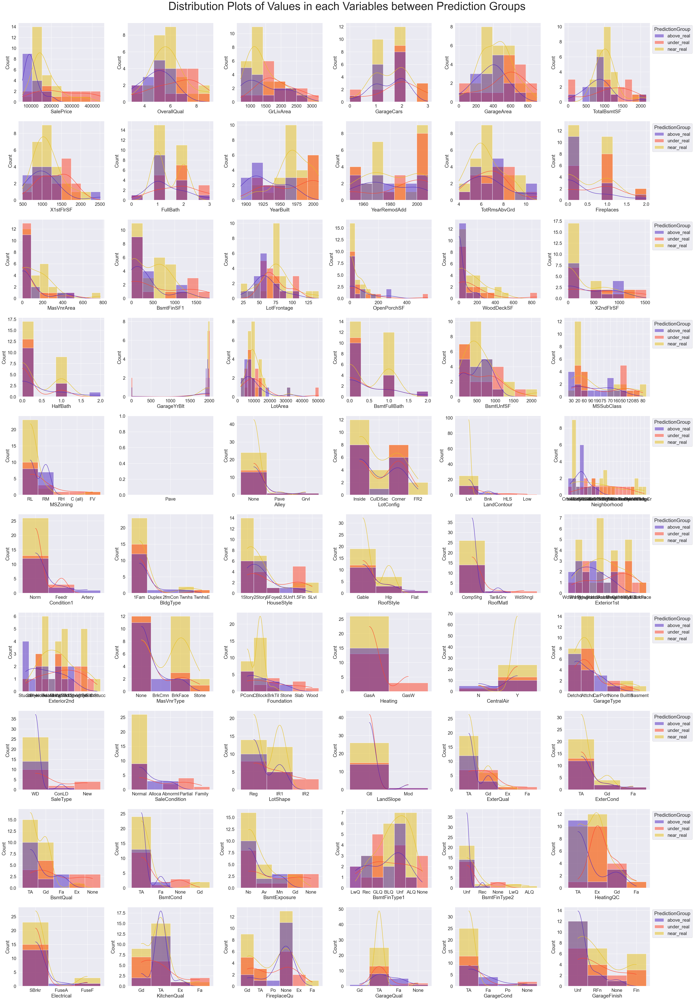

In [54]:
fig_rows = 10
fig_cols = 6

fig, ax = plt.subplots(fig_rows, fig_cols, figsize=(fig_cols*7, fig_rows*6))

rotate = ['Neighborhood', 'BldgType', 'HouseStyle', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'Foundation', 'GarageType', 'SaleCondition', 'SaleType', 'BsmntFinType1']

sns.set(font_scale=1.8)
for i in range(fig_rows):
    for j in range(fig_cols):
        n = i*fig_cols+j
        if i < len(variables):
            try:
                var = variables[n]
                if(j == 5):
                    hist = sns.histplot(data=final_df, x=var, ax = ax[i][j], kde=True, hue='PredictionGroup', palette='CMRmap')
                    sns.move_legend(hist, "upper left", bbox_to_anchor=(1, 1))
                    
                else:
                    hist = sns.histplot(data=final_df, x=var, ax = ax[i][j], kde=True, hue='PredictionGroup', palette='CMRmap')
                    hist.legend_.remove()

            except np.linalg.LinAlgError:
                pass

plt.suptitle("Distribution Plots of Values in each Variables between Prediction Groups", y = 1.00, fontsize = 48)
plt.tight_layout()
plt.show()

After we plot the distributions for the variables in the test dataset, we can see the difference in variable characteristics for Over Price (above_real), Under Price (under_real), and the one that is Good (near_real) house predictions for some significant features.

OverallQual (Higher Value can result in better prediction):
- If have higher value = Under Price
- If have lower value = Over Price

GarageCars and GarageArea:
- If 0 (No Garage) or large size = Over or Under Price (Bad Prediction)

TotalBsmtSF:
- If size around 0 or size too large = Over or Under Price (Bad Prediction)

1stFlr:
- If very large = Over Price 

YearBuilt:
- If built around 1900-1920 (in the past) = Over Price
- If built in the 21st century (recent) = Good or Under Price

OpenPorchSF, WoodDeckSF, HalfBath:
- If value too high = Over or Under Price (Bad Prediction)

KitchenQual:
- If Fa = Over or Under Price (Bad Prediction)

SaleType:
- If ConLD or New = Over or Under Price (Bad Prediction)

Alley:
- If Pave or Grvl = Over or Under Price (Bad Prediction)

Here, we can find that most of the time, the prediction will be Bad if the value is 0 or None, which most of them are filled in value (Missing from the Test Dataset)

In [55]:
pd.DataFrame(final_df.groupby('PredictionGroup')['Neighborhood'].value_counts())

Neighborhood
PredictionGroup Neighborhood              
above_real      OldTown                  6
                Crawfor                  2
                NAmes                    2
                BrDale                   1
                BrkSide                  1
                Edwards                  1
                IDOTRR                   1
                Sawyer                   1
near_real       NAmes                    9
                NridgHt                  3
                Edwards                  2
                Mitchel                  2
                NWAmes                   2
                BrDale                   1
                BrkSide                  1
                CollgCr                  1
                Gilbert                  1
                NoRidge                  1
                SWISU                    1
                Sawyer                   1
                Somerst                  1
under_real      BrkSide                  2
                Edwards                  2
                Crawfor                  1
                Gilbert                  1
                IDOTRR                   1
                Mitchel                  1
                NridgHt                  1
                OldTown                  1
                SWISU                    1
                SawyerW                  1
                Somerst                  1
                StoneBr                  1
                Timber                   1
                Veenker                  1

Neighborhood:
- If located in OldTown = Over Price
- If located in NAmes = Good Prediction

Exterior2nd:
- If Stucco = Over Price
- If VinylSd = Good Prediction

In [56]:
pd.DataFrame(final_df.groupby('PredictionGroup')['Exterior2nd'].value_counts())


Exterior2nd
PredictionGroup Exterior2nd             
above_real      Stucco                 4
                HdBoard                2
                MetalSd                2
                Plywood                2
                Wd Shng                2
                AsbShng                1
                Stone                  1
                Wd Sdng                1
near_real       HdBoard                6
                VinylSd                5
                Wd Sdng                5
                MetalSd                4
                Plywood                3
                AsbShng                1
                ImStucc                1
                Stucco                 1
under_real      MetalSd                3
                Plywood                3
                CmentBd                2
                VinylSd                2
                Wd Sdng                2
                Brk Cmn                1
                HdBoard                1
                Stucco                 1
                Wd Shng                1